<div><img src="https://github.com/digitalearthpacific/DigitalEarthPacific/blob/main/notebooks/DEP_LCAST/reference_materials/images/1B/1.a.png?raw=true" width="800"/></div>


# Activity Notebook Introduction to Digital Earth Pacific Abstraction Libary (DEPAL)
Intended for users of DEP. Completion of **'Activity Notebook Intro to Python'** as a prerequisite is recommended although not required. The notebook provides the foundations of Python more broadly. This **'Activity Notebook Intro to depal'** includes the introduction to [Digital Earth Pacific (DEP)](https://github.com/digitalearthpacific/DigitalEarthPacific/tree/main). We will again be working with Python within a Jupyter Notebook environment as the IDE. 

For questions regarding this notebook contact the author via https://github.com/nicholasmetherall

### Digital Earth Pacific (DEP) Notebook

Follow the example of code below to set up your Digital Earth Pacific (DEP) environment.

In [91]:
import sys
sys.path.append('../../')
import depal_fj as dep
import warnings
warnings.filterwarnings('ignore')

import geopandas as gpd
import numpy as np
import odc.geo.xr  # noqa: F401
import pandas as pd
import xarray as xr
from odc.stac import load
from pystac_client import Client
from shapely import geometry
from shapely.geometry import box
from shapely.ops import split
from shapely.affinity import translate

<font color='blue'>1.1. Listing Fiji island boundary datasets in depal 

Your code goes in the cells below. Add more cells here by clicking on the + button above.

First let's list out the countries covered within Digital Earth Pacific (DEP):  

> dep.list_islands()

- Where *dep.* is the module   
- *list_islands()* is the function that converts requests or simple operations into an object. 

By running this block of code you can process data. This particular function returns a list of boundaries of islands in Fiji covered within the DEP module.   

Note: these boundaries are based upon official Fiji Government data.

> Input your code for 1.1 in this cell eg. dep.list_islands()

In [18]:
 dep.list_islands()

,0
0,Aiwa
1,Aroua
2,Avea
3,Batiki
4,Beqa
5,Buabua-Nadi
6,Bulia
7,Central
8,Cicia
9,Cikobia


<font color='blue'>1.2. Getting a single Fiji island dataset and configuring this as your area of interest

The list you have generated above is an example of how to call on default values stored within a library. 

Now that you have the list of datasets, you can try to access one of these datasets by calling it. This will laod the data and configure it to be your area of interest for further analysis in depal. In order to do this, we will next seek to use: 
    
> dep.get_island("island name") function. 

First type the module 'dep.' then type the function 'get_island' then within the brackets you can search for a particular subset of the total list above. You can choose one from the list above and don't forgot to place it between quotations: e.g. "Koro".

> Input your code for 1.2 in this cell eg. dep.get_island("Koro")

In [19]:
dep.get_island("Vanua Levu")

145    MULTIPOLYGON (((177.04871 -17.46168, 177.04870...
Name: geometry, dtype: geometry

<font color='blue'>1.3. Define this dataset within a new variable

To make it easier to use this dataset going forward through the activity, you can define it within a variable. 
    
To do this, save the code from 1.2 into a variable name. The variable name can be the name of the island you have chosen: e.g. Beqa. 
    
Then after typing the island you have chosen input " = " and then make this equal the code you have entered in 1.2.

So in this example, the code input would be:
    
> Beqa = dep.get_island("Beqa")
    
This new variable allows you to store the results from 1.2 and easily use them going forward. 
    
> Input your code for 1.3 in this cell eg. Koro = dep.get_island("Koro")

In [20]:
VL = dep.get_island("Vanua Levu")

<font color='blue'>1.4. Visualising and exploring Fiji island dataset with an interactive map

Now that you have accessed this data and downloaded this data you can now visualise this data in an interactive map as part of the leafmap functionality within Python notebooks. This function has been wrapped and simplified in DEP using the **explore()** function. 

Try to input your area of interest variable followed by: 
    
> .explore()
    
Once loaded, try out this interactive map by scrolling in and out and panning around to different areas of the basemap.
    
> Input your code for 1.4 in this cell eg. Koro.explore()

In [34]:
VL.explore()

<font color='blue'>2. Practicing this workflow at the division scale

Now through this workflow you have learned how to do the following steps at the island scale:
    
> 1. dep.list_islands() - List the boundary datasets available
> 2. dep.get_island() - Get one of the boundary datasets and use configure this to be your area of interest 
> 3. var = ... - Define this boundary dataset within a new variable
> 4. var.explore() - Explore this boundary dataset within an interactive map
    
Practice this workflow by repeating this step but this time instead of working at the island scale you will be working at the divisional scale.  

<font color='blue'>2.1 List boundaries available at the division scale

You will be following a similar step to 1.1 except now instead of listing islands you will use 
    
> dep.list_divisions()
    
Running this code should generate a list of the five divisions:

In [35]:
dep.list_divisions()

,0
0,Central
1,Eastern
2,Northern
3,Rotuma
4,Western


<font color='blue'>2.2 Get a single division boundary for your aoi following a similar workflow to 1.2:
> dep.get_division()

In [36]:
dep.get_division("Northern")

0    MULTIPOLYGON (((178.28127 -16.83322, 178.28140...
Name: geometry, dtype: geometry

<font color='blue'>2.3 Define this division boundary within a new variable using a similar step to 1.3:


In [37]:
ND = dep.get_division("Northern")

<font color='blue'>2.4 Explore this division boundary using a similar step to 1.4:


In [38]:
ND.explore()

<font color='blue'>3.1. Loading a geojson:

If you have your own geojson file for an aoi in Fiji already, you can simply drag and drop it into this Jupyter folder - if you do not have a .geojson file already, you can use one we have prepared earlier:   
    
> "suva-nausori.geojson"
    
<div><img src="https://github.com/digitalearthpacific/DigitalEarthPacific/blob/main/notebooks/DEP_LCAST/reference_materials/images/1B/1B.3.1..JPG?raw=true" width="400"/></div>

Try double clicking on your geojson file to open it and to verify that it is the area that you are seeking to analyse: 

<div><img src="https://github.com/digitalearthpacific/DigitalEarthPacific/blob/main/notebooks/DEP_LCAST/reference_materials/images/1B/1B.3.2.JPG?raw=true" width="800"/></div>


<font color='blue'>3.2. Loading geojson into depal 
    
To load this geojson area into depal use the function: 
    
> dep.get_area_from_geojson("filename.geojson") 
    
Note, do not forget to place your filename within quotations "..." including the extension
    
> Input your code for 3.2 in this cell eg. dep.get_area_from_geojson("...")

In [39]:
dep.get_area_from_geojson("suva-nausori.geojson")

,geometry
0,"POLYGON ((178.29920 -17.96520, 178.29920 -18.1..."


<font color='blue'>3.3. Define this new aoi within a new variable (refer to 2.3) 

In [40]:
SN = dep.get_area_from_geojson("suva-nausori.geojson")

<font color='blue'>3.4 Explore this aoi using the explore() function (refer to 2.4): 


In [41]:
SN.explore()

#### **<font color='green'>Well done...**

You have learned how to set up your area of interest in depal. Now we will begin working with the satellite imagery data. 

Note that there are a range of different datasets and models. For this activity we are most interested in the **Sentinel 2** dataset. 
This data has been pre-processed as a GeoMAD product for use in this workshop. This will be explained in the workshop. 

### <font color='blue'>Learning about the European Space Agency Sentinel 2 Satellite.</font>
<font color = 'blue' ></font>

The main satellite data we will be using for this workshop is from the Copernicus Sentinel 2 satellite dataset as shown in figure s.2.a. 

<div><img src="https://github.com/digitalearthpacific/DigitalEarthPacific/blob/main/notebooks/DEP_LCAST/reference_materials/images/1B/Sentinel.1.jpg?raw=true" width="600"/></div>


Figure S.2.a. Provides an overview of Sentinel 2 satellite:

The table in figure S.2.b. provides a list of the different bands or spectral wavelengths captured by the Sentinel 2 satellite. We will be using these for our analyses within the workshop. 

The bands are measured in wavelengths with unit measurements of nanometers. Visible light is measured in nanometers (nm). A nanometer is a unit of length equal to one billionth of a meter.

<font color='blue'>4.1. Learning about spectral bands: 

These include optical bands we can see with the human eye:
- (B2) Blue = 458-523 nm
- (B3) Green = 543-578 nm 
- (B4) Red = 650-680 nm

And infrared bands that cannot be detected by the human eye:
- (B8) Near Infrared or NIR = 785-900 nm
- (B11) Shortwave Infrared 1 or SWIR 1 = 1565-1655 nm

For the full list see Figure S.2.b.

<div><img src="https://github.com/digitalearthpacific/DigitalEarthPacific/blob/main/notebooks/DEP_LCAST/reference_materials/images/1B/Sentinel.2.png?raw=true="600" width="580"/></div>  

Figure S.2.b. Table list of spectral bands captured by sensors on the Sentinel 2 satellite

A visualisation of these bands from the table in S.2.b. is visualised as a spectrum in figure S.2.c.
    
    
    
    
    
<div><img src="https://github.com/digitalearthpacific/DigitalEarthPacific/blob/main/notebooks/DEP_LCAST/reference_materials/images/1B/Sentinel.3.jpg?raw=true="600" width="580"/></div>    

Figure S.2.c. The spectrum of different wavelengths visualised:

<font color='blue'>4.2. Get annual Red Green and Blue (RGB) data for your aoi:
    
Now we can get our satellite data using depal for our predefined aoi. The function to load the red green and blue bands of satellite data is as follows:

> dep.get_annual_rgb(aoi, year)
    
> Input your code for 4.1 in this cell eg. dep.get_annual_rgb(aoi, year)
    
For the first input within the brackets you will first need to input your own aoi variable where it says 'aoi'.

For the second input within the brackets after the aoi you will need to input a , and then you will need to input a year between 2017-2023. 

In [56]:
dep.get_annual_rgb(SN,2018)

<xarray.Dataset> Size: 106MB
Dimensions:      (y: 2376, x: 3705)
Coordinates:
  * y            (y) float64 19kB -2.02e+06 -2.02e+06 ... -2.044e+06 -2.044e+06
  * x            (x) float64 30kB 3.15e+06 3.15e+06 ... 3.187e+06 3.187e+06
    spatial_ref  int32 4B 3832
    time         datetime64[ns] 8B 2018-01-01
Data variables:
    B04          (y, x) float32 35MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    B03          (y, x) float32 35MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    B02          (y, x) float32 35MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>

<font color='blue'>4.3 Define your answer from 4.2 within a new variable:
    
> For example data = ....

In [57]:
ARGB = dep.get_annual_rgb(SN,2018)

<font color='blue'>4.3 Plot this data for visualisation:
    
Plotting this data will allow you to see the results. Here we use :
    
> dep.plot_rgb(data) 
    
Where data is the variable you defined in 4.3.   

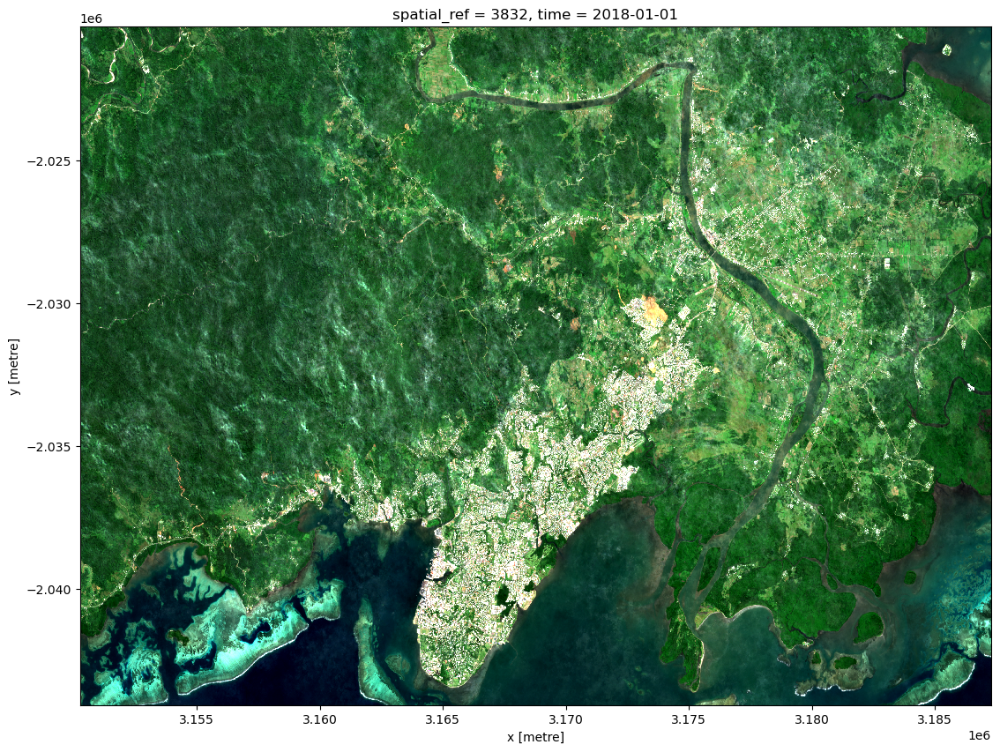

In [58]:
dep.plot_rgb(ARGB)

#### **<font color='green'>Congratulations you have now completed the intro to depal notebook activity.**

<font color='purple'>5.1 Optional bonus activity: if you have finished all the other activities and still have time before the next part of the course, you can master the workflows of 1.1-1.4 and 2.1-2.4 by practicing these steps one more time but this time at the province level:

In [133]:
dep.get_area_from_geojson("fiji_coral_coast.geojson")

,geometry
0,"POLYGON ((177.47314 -18.30238, 178.49487 -18.3..."


In [134]:
NR = dep.get_area_from_geojson("fiji_coral_coast.geojson")

In [135]:
NR.explore()

In [136]:
dep.get_annual_rgb(NR,2023)

<xarray.Dataset> Size: 394MB
Dimensions:      (y: 2888, x: 11375)
Coordinates:
  * y            (y) float64 23kB -2.031e+06 -2.031e+06 ... -2.06e+06 -2.06e+06
  * x            (x) float64 91kB 3.058e+06 3.058e+06 ... 3.172e+06 3.172e+06
    spatial_ref  int32 4B 3832
    time         datetime64[ns] 8B 2023-01-01
Data variables:
    B04          (y, x) float32 131MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    B03          (y, x) float32 131MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    B02          (y, x) float32 131MB dask.array<chunksize=(2048, 2048), meta=np.ndarray>

In [137]:
argb = dep.get_annual_rgb(NR,2023)

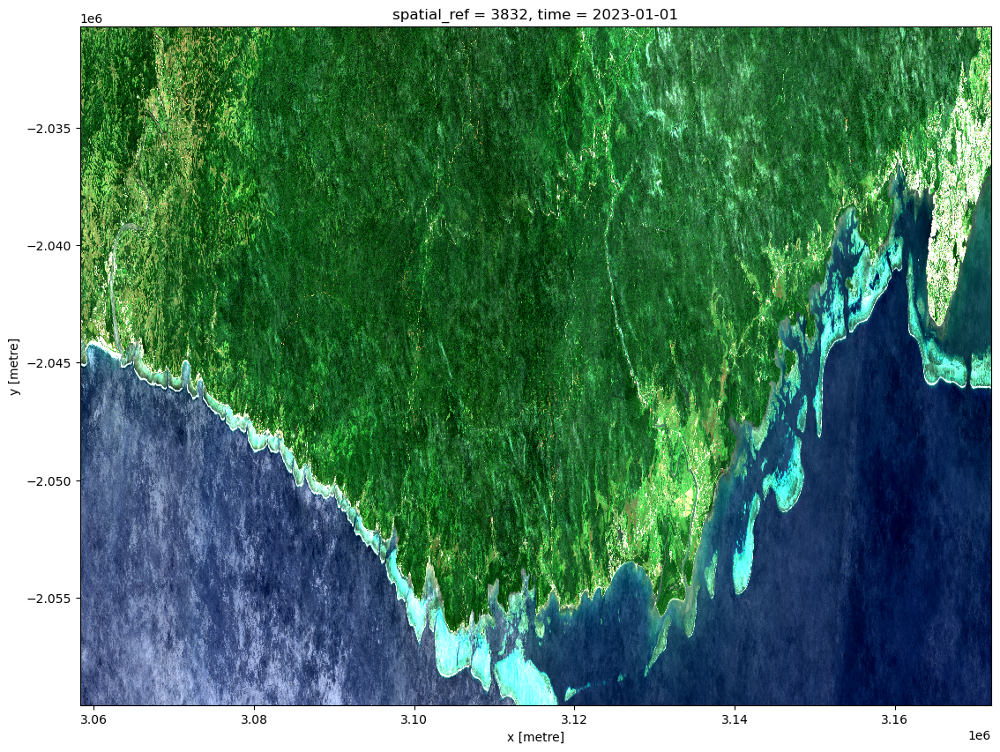

In [138]:
dep.plot_rgb(argb)